# 🦠 Análisis Exploratorio del COVID-19 en Australia y el Mundo

Este cuaderno tiene como objetivo realizar un **análisis exploratorio de datos (EDA)** del impacto del COVID-19, 
tanto a nivel **mundial** como específicamente en **Australia**.

Se utilizan diversas librerías de Python para el manejo, un poco limpieza, visualización y análisis estadístico de los datos.

---

## 📋 Objetivos del análisis

1. Comprender la evolución de los casos y muertes por COVID-19 a nivel global.  
2. Analizar la situación particular de **Australia** en comparación con otros países.  
3. Identificar patrones, tendencias y comportamientos relevantes en los datos.  
4. Aplicar herramientas de **pandas**, **matplotlib**, **seaborn** y otras librerías para visualizar resultados.

---


# COVID-19 Novel Coronavirus: EDA 

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.graph_objects as go
from prophet import Prophet
import pycountry
import plotly.express as px
from collections import namedtuple

/Users/user/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data Import, Preprocessing and EDA

In [9]:
import os
os.getcwd()


'/Users/user/Documents/CienciaDatos'

In [10]:
import pandas as pd

# Archivo principal
df = pd.read_csv('/Users/user/Documents/CienciaDatos/covid_19_data.csv', parse_dates=['Last Update'])
df.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

# Archivos adicionales
df_confirmed = pd.read_csv('/Users/user/Documents/CienciaDatos/time_series_covid_19_confirmed.csv')
df_recovered = pd.read_csv('/Users/user/Documents/CienciaDatos/time_series_covid_19_recovered.csv')
df_deaths = pd.read_csv('/Users/user/Documents/CienciaDatos/time_series_covid_19_deaths.csv')

# Renombrar columnas
df_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
df_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
df_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)


In [11]:
df_confirmed.head()

,Province/State,Country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,64575,65080,65486,65728,66275,66903,67743,68366,69130,70111
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132118,132153,132176,132209,132215,132229,132244,132264,132285,132297
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,126156,126434,126651,126860,127107,127361,127646,127926,128198,128456
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13569,13569,13569,13569,13569,13664,13671,13682,13693,13693
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,31661,31909,32149,32441,32623,32933,33338,33607,33944,34180


## First Data Exploration

In [12]:
df.head()

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


## Latest Cases

In [13]:
df.tail()

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
306424,306425,05/29/2021,Zaporizhia Oblast,Ukraine,2021-05-30 04:20:55,102641.0,2335.0,95289.0
306425,306426,05/29/2021,Zeeland,Netherlands,2021-05-30 04:20:55,29147.0,245.0,0.0
306426,306427,05/29/2021,Zhejiang,Mainland China,2021-05-30 04:20:55,1364.0,1.0,1324.0
306427,306428,05/29/2021,Zhytomyr Oblast,Ukraine,2021-05-30 04:20:55,87550.0,1738.0,83790.0
306428,306429,05/29/2021,Zuid-Holland,Netherlands,2021-05-30 04:20:55,391559.0,4252.0,0.0


In [14]:
df2 = df.groupby(["Date", "Country", "Province/State"], as_index=False)[['Confirmed', 'Deaths', 'Recovered']].sum()


## By Country View (World)

In [15]:
df2

,Date,Country,Province/State,Confirmed,Deaths,Recovered
0,01/01/2021,Australia,Australian Capital Territory,118.0,3.0,114.0
1,01/01/2021,Australia,New South Wales,4947.0,54.0,0.0
2,01/01/2021,Australia,Northern Territory,75.0,0.0,71.0
3,01/01/2021,Australia,Queensland,1255.0,6.0,1224.0
4,01/01/2021,Australia,South Australia,580.0,4.0,566.0
...,...,...,...,...,...,...
228316,12/31/2020,Ukraine,Vinnytsia Oblast,22500.0,395.0,15237.0
228317,12/31/2020,Ukraine,Volyn Oblast,33016.0,515.0,28605.0
228318,12/31/2020,Ukraine,Zakarpattia Oblast,28200.0,637.0,23526.0
228319,12/31/2020,Ukraine,Zaporizhia Oblast,54088.0,594.0,20530.0


## By Country View (Australia)

In [16]:
df.query('Country=="Australia"').groupby("Last Update")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Last Update,Confirmed,Deaths,Recovered
0,1/23/20 17:00,0.0,0.0,0.0
1,1/25/20 17:00,4.0,0.0,0.0
2,1/26/20 16:00,4.0,0.0,0.0
3,1/27/20 23:59,5.0,0.0,0.0
4,1/28/20 23:00,5.0,0.0,0.0
...,...,...,...,...
161,2021-05-30 04:20:55,30096.0,910.0,23579.0
162,3/8/20 5:31,13475.0,54.0,837.0
163,4/2/20 8:53,5116.0,24.0,520.0
164,4/4/20 9:38,5550.0,30.0,701.0


## By Country (Sorted)

In [17]:
df.groupby("Country")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Country,Confirmed,Deaths,Recovered
0,Azerbaijan,1.0,0.0,0.0
1,"('St. Martin',)",2.0,0.0,0.0
2,Afghanistan,17026442.0,669075.0,13464399.0
3,Albania,19768869.0,375955.0,13945256.0
4,Algeria,27684358.0,834464.0,18959299.0
...,...,...,...,...
224,West Bank and Gaza,41819444.0,440378.0,37003116.0
225,Yemen,962066.0,237613.0,506523.0
226,Zambia,13493953.0,205990.0,12625626.0
227,Zimbabwe,6484581.0,237234.0,5594887.0


# Visualizations

In [18]:
df.groupby('Date').sum()

,SNo,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
Date,,,,,,,
01/01/2021,147143024,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,84092619.0,1834675.0,47313005.0
01/02/2021,147725193,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,84718978.0,1843108.0,47614297.0
01/03/2021,148502118,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,85251774.0,1850449.0,47882779.0
01/04/2021,149085814,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,85805892.0,1860598.0,48173187.0
01/05/2021,149669510,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,86546014.0,1875953.0,48488548.0
...,...,...,...,...,...,...,...
12/27/2020,144232179,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,80912611.0,1771659.0,45717710.0
12/28/2020,144814348,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,81408934.0,1781415.0,46016136.0
12/29/2020,145396517,AbruzzoAcreAdygea RepublicAguascalientesAichiA...,AfghanistanAlbaniaAlgeriaAndorraAngolaAntigua ...,2021-04-02 15:13:532021-04-02 15:13:532021-04-...,82073362.0,1796786.0,46369231.0


## Summary Plot of Worldwide Cases - Confirmed, Deaths & Recovered

In [19]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

In [20]:
import pandas as pd
import plotly.graph_objects as go

# Filtrar datos para Australia y agrupar por fecha
df_aus = df.query('Country=="Australia"')
df_aus_grouped = df_aus.groupby('Date')[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

fig = go.Figure()

# Confirmed - azul brillante
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Confirmed'],
    name='Confirmed',
    marker=dict(
        color='#007BFF',  # Azul vivo
        line=dict(color='black', width=0.6)  # Borde sutil negro
    )
))

# Deaths - rojo intenso
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Deaths'],
    name='Deaths',
    marker=dict(
        color='#FF1E1E',  # Rojo brillante
        line=dict(color='black', width=0.6)
    )
))

# Recovered - verde vibrante
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Recovered'],
    name='Recovered',
    marker=dict(
        color='#00C851',  # Verde brillante
        line=dict(color='black', width=0.6)
    )
))

# --- CONFIGURACIÓN DEL LAYOUT ---
fig.update_layout(
    title=dict(
        text='COVID-19 Cases in Australia - Confirmed, Deaths, Recovered (Bar Chart)',
        font=dict(size=22, color='#222')
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        title=dict(text='Date', font=dict(size=16, color='#111')),
        tickfont=dict(size=12, color='#333'),
        tickangle=45,
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title=dict(text='Number of Cases', font=dict(size=16, color='#111')),
        tickfont=dict(size=12, color='#333'),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        title='Case Type',
        font=dict(size=13),
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
    bargap=0.25  # Espacio entre barras
)

fig.show()


In [21]:
import pandas as pd
import plotly.graph_objects as go

# Filtrar datos para Australia
df_aus = df.query('Country == "Australia"').copy()

# Asegurar formato de fecha
df_aus['Date'] = pd.to_datetime(df_aus['Date'], errors='coerce')

# Filtrar solo el primer semestre de 2020 (enero a junio)
df_aus_first_semester = df_aus[
    (df_aus['Date'] >= '2020-01-01') & (df_aus['Date'] <= '2020-06-30')
]

# Agrupar por fecha
df_aus_grouped = df_aus_first_semester.groupby('Date')[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

# Crear figura
fig = go.Figure()

# Confirmed - azul brillante
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Confirmed'],
    name='Confirmed',
    marker=dict(color='#007BFF', line=dict(color='black', width=0.6))
))

# Deaths - rojo intenso
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Deaths'],
    name='Deaths',
    marker=dict(color='#FF1E1E', line=dict(color='black', width=0.6))
))

# Recovered - verde brillante
fig.add_trace(go.Bar(
    x=df_aus_grouped['Date'],
    y=df_aus_grouped['Recovered'],
    name='Recovered',
    marker=dict(color='#00C851', line=dict(color='black', width=0.6))
))

# --- CONFIGURACIÓN DEL LAYOUT ---
fig.update_layout(
    title=dict(
        text='COVID-19 Cases in Australia - First Semester 2020 (Confirmed, Deaths, Recovered)',
        font=dict(size=22, color='#222')
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        title=dict(text='Date', font=dict(size=16, color='#111')),
        tickfont=dict(size=12, color='#333'),
        tickangle=45,
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title=dict(text='Number of Cases', font=dict(size=16, color='#111')),
        tickfont=dict(size=12, color='#333'),
        showgrid=True,
        gridcolor='lightgray'
    ),
    legend=dict(
        title='Case Type',
        font=dict(size=13),
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
    bargap=0.25
)

fig.show()


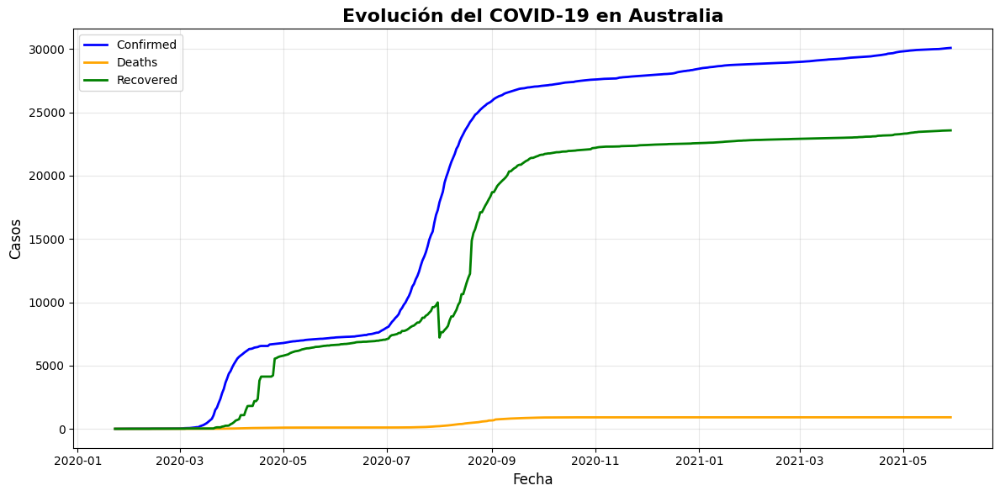

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# --- FILTRAR SOLO AUSTRALIA ---
df_aus = df[df['Country'] == 'Australia'].copy()

# --- CAMBIA AQUÍ según el nombre de tu columna ---
df_aus['Date'] = pd.to_datetime(df_aus['Date'], errors='coerce')

# --- AGRUPAR DATOS POR FECHA ---
ts_aus = df_aus.groupby('Date')[['Confirmed', 'Deaths', 'Recovered']].sum().sort_index()

# --- CONFIGURAR ESTILO ---
plt.style.use('default')  # fondo blanco

# --- CREAR FIGURA ---
fig, ax = plt.subplots(figsize=(12, 6))

# --- TRAYECTORIAS ---
ax.plot(ts_aus.index, ts_aus['Confirmed'], label='Confirmed', color='blue', linewidth=2)
ax.plot(ts_aus.index, ts_aus['Deaths'], label='Deaths', color='orange', linewidth=2)
ax.plot(ts_aus.index, ts_aus['Recovered'], label='Recovered', color='green', linewidth=2)

# --- ETIQUETAS Y TÍTULO ---
ax.set_title('Evolución del COVID-19 en Australia', fontsize=16, fontweight='bold')
ax.set_xlabel('Fecha', fontsize=12)
ax.set_ylabel('Casos', fontsize=12)

# --- LEYENDA Y ESTILO ---
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()

# --- MOSTRAR ---
plt.show()




In [23]:
import pandas as pd

# 🔹 Filtramos los datos originales solo para Colombia
df_aus = df[df['Country'] == 'Australia'].copy()

# 🔹 Filtramos también la tabla de coordenadas (latitud y longitud)
df_confirmed_aus = df_confirmed[["Province/State", "Lat", "Long", "Country"]].copy()
df_confirmed_aus = df_confirmed_aus[df_confirmed_aus['Country'] == 'Australia']

# 🔹 Unimos (merge) los datos COVID de Colombia con las coordenadas
df_latlong_aus = pd.merge(df_aus, df_confirmed_aus, on=["Country", "Province/State"], how='left')

# ✅ Verificamos el resultado
print(df_latlong_aus.head())


   SNo        Date   Province/State    Country    Last Update  Confirmed  \
0   83  01/23/2020              NaN  Australia  1/23/20 17:00        0.0   
1  173  01/25/2020              NaN  Australia  1/25/20 17:00        4.0   
2  221  01/26/2020              NaN  Australia  1/26/20 16:00        4.0   
3  276  01/27/2020  New South Wales  Australia  1/27/20 23:59        4.0   
4  277  01/27/2020         Victoria  Australia  1/27/20 23:59        1.0   

   Deaths  Recovered      Lat      Long  
0     0.0        0.0      NaN       NaN  
1     0.0        0.0      NaN       NaN  
2     0.0        0.0      NaN       NaN  
3     0.0        0.0 -33.8688  151.2093  
4     0.0        0.0 -37.8136  144.9631  


In [24]:
import pandas as pd
import plotly.express as px

# --- 🔹 Filtrar datos para Australia ---
df_australia = df[df['Country'] == 'Australia'].copy()

# --- 🔹 Seleccionar columnas necesarias del DataFrame de coordenadas ---
df_confirmed_aus = df_confirmed[["Province/State", "Lat", "Long", "Country"]].copy()
df_confirmed_aus = df_confirmed_aus[df_confirmed_aus['Country'] == 'Australia']

# --- 🔹 Combinar datasets por País y Provincia ---
df_latlong_aus = pd.merge(df_australia, df_confirmed_aus, on=["Country", "Province/State"], how='left')

# --- 🔹 Asegurar formato de fecha ---
df_latlong_aus['Date'] = pd.to_datetime(df_latlong_aus['Date'], errors='coerce')

# --- 🔹 Crear el mapa de densidad ---
fig = px.density_mapbox(
    df_latlong_aus, 
    lat="Lat", 
    lon="Long", 
    hover_name="Province/State", 
    hover_data=["Confirmed", "Deaths", "Recovered"], 
    animation_frame="Date", 
    color_continuous_scale="Portland", 
    radius=7, 
    zoom=3.5,   # Zoom adecuado para Australia
    height=700
)

# --- 🔹 Configurar diseño del mapa ---
fig.update_layout(
    title='COVID-19 en Australia: Evolución de Casos Confirmados, Muertes y Recuperados',
    font=dict(family="Courier New, monospace", size=16, color="black"),
    mapbox_style="open-street-map",  # Fondo blanco y estilo simple
    mapbox_center={"lat": -25.2744, "lon": 133.7751},  # 🌏 Centro geográfico de Australia
    paper_bgcolor='white',   # Fondo general blanco
    plot_bgcolor='white',    # Fondo del área del gráfico blanco
    margin=dict(l=0, r=0, t=60, b=0)
)

# --- 🔹 Mostrar gráfico ---
fig.show()



/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/1416482478.py:18: DeprecationWarning:

*density_mapbox* is deprecated! Use *density_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



## Analysis by Country

We use Plotly (https://plot.ly/python/bubble-maps/) for the visuals

### Latest Date in Data

In [25]:
confirmed = df2.groupby(['Date', 'Country']).sum()[['Confirmed']].reset_index()
deaths = df2.groupby(['Date', 'Country']).sum()[['Deaths']].reset_index()
recovered = df2.groupby(['Date', 'Country']).sum()[['Recovered']].reset_index()

In [26]:
latest_date = confirmed['Date'].max()
latest_date

'12/31/2020'

In [27]:
confirmed = confirmed[(confirmed['Date']==latest_date)][['Country', 'Confirmed']]
deaths = deaths[(deaths['Date']==latest_date)][['Country', 'Deaths']]
recovered = recovered[(recovered['Date']==latest_date)][['Country', 'Recovered']]

### Countries/Regions Affected

In [28]:
all_countries = confirmed['Country'].unique()
print("Number of countries/regions with cases: " + str(len(all_countries)))
print("Countries/Regions with cases: ")
for i in all_countries:
    print("    " + str(i))

Number of countries/regions with cases: 25
Countries/Regions with cases: 
    Australia
    Belgium
    Brazil
    Canada
    Chile
    Colombia
    Denmark
    France
    Germany
    Hong Kong
    India
    Italy
    Japan
    Macau
    Mainland China
    Mexico
    Netherlands
    Pakistan
    Peru
    Russia
    Spain
    Sweden
    UK
    US
    Ukraine


In [29]:
import pycountry

# Imprimir todos los nombres de países
for country in pycountry.countries:
    print(country.name)


Aruba
Afghanistan
Angola
Anguilla
Åland Islands
Albania
Andorra
United Arab Emirates
Argentina
Armenia
American Samoa
Antarctica
French Southern Territories
Antigua and Barbuda
Australia
Austria
Azerbaijan
Burundi
Belgium
Benin
Bonaire, Sint Eustatius and Saba
Burkina Faso
Bangladesh
Bulgaria
Bahrain
Bahamas
Bosnia and Herzegovina
Saint Barthélemy
Belarus
Belize
Bermuda
Bolivia, Plurinational State of
Brazil
Barbados
Brunei Darussalam
Bhutan
Bouvet Island
Botswana
Central African Republic
Canada
Cocos (Keeling) Islands
Switzerland
Chile
China
Côte d'Ivoire
Cameroon
Congo, The Democratic Republic of the
Congo
Cook Islands
Colombia
Comoros
Cabo Verde
Costa Rica
Cuba
Curaçao
Christmas Island
Cayman Islands
Cyprus
Czechia
Germany
Djibouti
Dominica
Denmark
Dominican Republic
Algeria
Ecuador
Egypt
Eritrea
Western Sahara
Spain
Estonia
Ethiopia
Finland
Fiji
Falkland Islands (Malvinas)
France
Faroe Islands
Micronesia, Federated States of
Gabon
United Kingdom
Georgia
Guernsey
Ghana
Gibraltar
Gui

In [30]:
print('UK' in list(country.name for country in pycountry.countries))
print('United Kingdom' in list(country.name for country in pycountry.countries))

False
True


In [31]:
confirmed2 = confirmed.copy()
deaths2 = deaths.copy()
recovered2 = recovered.copy()
bubble_plot_dfs = [confirmed2, deaths2, recovered2]
for df_ in bubble_plot_dfs:
    df_["Country"].replace({'Mainland China': 'China'}, inplace=True)
    df_["Country"].replace({'UK': 'United Kingdom'}, inplace=True)
    df_["Country"].replace({'US': 'United States'}, inplace=True)

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/2853117316.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [32]:
countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3
    
confirmed2["iso_alpha"] = confirmed2["Country"].map(countries.get)
deaths2["iso_alpha"] = deaths2["Country"].map(countries.get)
recovered2["iso_alpha"] = recovered2["Country"].map(countries.get)

In [33]:
plot_data_confirmed = confirmed2[["iso_alpha","Confirmed", "Country"]]
plot_data_deaths = deaths2[["iso_alpha","Deaths"]]
plot_data_recovered = recovered2[["iso_alpha","Recovered"]]

In [34]:
fig = px.scatter_geo(plot_data_confirmed, locations="iso_alpha", color="Country",
                     hover_name="iso_alpha", size="Confirmed",
                     projection="natural earth", title = 'Worldwide Confirmed Cases')
fig.show()

In [35]:
fig = px.scatter_geo(plot_data_deaths, locations="iso_alpha", color="Deaths",
                     hover_name="iso_alpha", size="Deaths",
                     projection="natural earth", title="Worldwide Death Cases")
fig.show()

In [36]:
fig = px.scatter_geo(plot_data_recovered, locations="iso_alpha", color="Recovered",
                     hover_name="iso_alpha", size="Recovered",
                     projection="natural earth", title="Worldwide Recovered Cases")
fig.show()

## Transforming Data for Forecasting

In [37]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

In [38]:
confirmed.columns = ['ds','y']
#confirmed['ds'] = confirmed['ds'].dt.date
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

In [39]:
confirmed.head()

,ds,y
0,2021-01-01,84092619.0
1,2021-01-02,84718978.0
2,2021-01-03,85251774.0
3,2021-01-04,85805892.0
4,2021-01-05,86546014.0


# Forecasting Total Number of Cases Worldwide

## Prophet

We use Prophet, a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. It is also an open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

## Why Prophet?

Prophet is easy to customize and use, and to produce accurate forecasts which can be explained intuitively with supporting evidence such as forecast seasonality components. It allows the analyst to explain in an intuitive and convinving manner to higher management as to why the forecasts are as such, and the plausible underlying factors that contribute to its result. Furthermore, it is also open-source! :

## References 
- https://facebook.github.io/prophet/
- https://facebook.github.io/prophet/docs/
- https://github.com/facebook/prophet

## Forecasting Confirmed Cases Worldwide with Prophet (Baseline)

We perform a week's ahead forecast with Prophet, with 95% prediction intervals. Here, no tweaking of seasonality-related parameters and additional regressors are performed.

In [40]:
%pip install prophet
%pip install fbprophet
from prophet import Prophet 


Defaulting to user installation because normal site-packages is not writeable
  Using cached cmdstanpy-1.3.0-py3-none-any.whl (99 kB)
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  ERROR: Command errored out with exit status 1:
   command: /Library/Developer/CommandLineTools/usr/bin/python3 -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/pip-install-2es21187/fbprophet_71d8cc8296574eff82ada83c07a2c09d/setup.py'"'"'; __file__=

In [41]:
m = Prophet(interval_width=0.95)
m.fit(confirmed)
future = m.make_future_dataframe(periods=7)
future_confirmed = future.copy() # for non-baseline predictions later on
future.tail()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


,ds
496,2021-06-01
497,2021-06-02
498,2021-06-03
499,2021-06-04
500,2021-06-05


In [42]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
496,2021-06-01,1.706700e+08,1.686081e+08,1.727114e+08
497,2021-06-02,1.713310e+08,1.691364e+08,1.732219e+08
498,2021-06-03,1.720043e+08,1.700028e+08,1.739642e+08
499,2021-06-04,1.726676e+08,1.705429e+08,1.745789e+08
500,2021-06-05,1.732867e+08,1.711362e+08,1.753235e+08


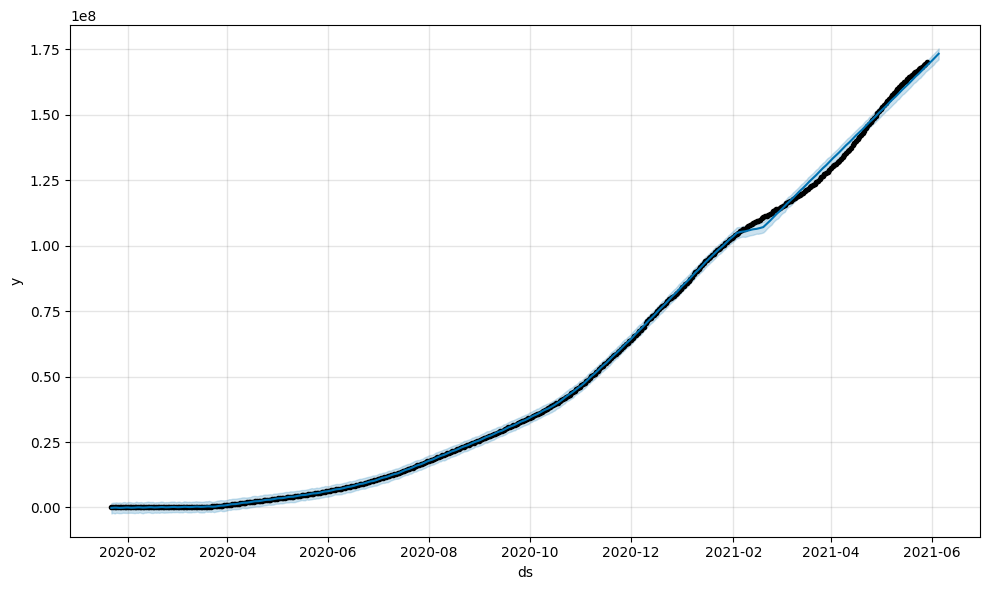

In [43]:
confirmed_forecast_plot = m.plot(forecast)

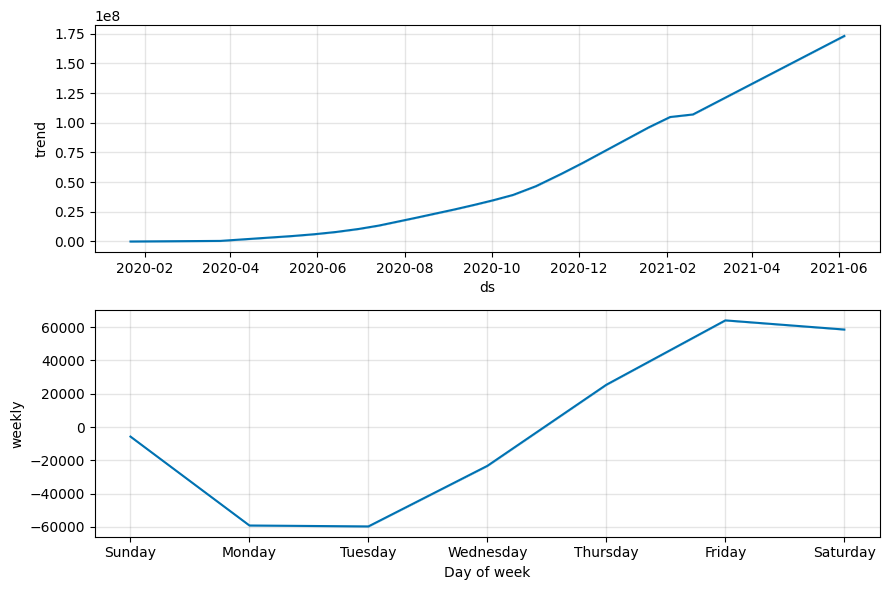

In [44]:
forecast_components = m.plot_components(forecast)

## Forecasting Deaths Worldwide with Prophet (Baseline)

We perform a week's ahead forecast with Prophet, with 95% prediction intervals. Here, no tweaking of seasonality-related parameters and additional regressors are performed.

In [45]:
deaths.columns = ['ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])

In [46]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=7)
future_deaths = future.copy() # for non-baseline predictions later on
future.tail()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


,ds
496,2021-06-01
497,2021-06-02
498,2021-06-03
499,2021-06-04
500,2021-06-05


In [47]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
496,2021-06-01,3.528920e+06,3.503565e+06,3.552927e+06
497,2021-06-02,3.541176e+06,3.516383e+06,3.567276e+06
498,2021-06-03,3.553172e+06,3.528862e+06,3.578745e+06
499,2021-06-04,3.564986e+06,3.538772e+06,3.592696e+06
500,2021-06-05,3.575519e+06,3.550208e+06,3.601546e+06


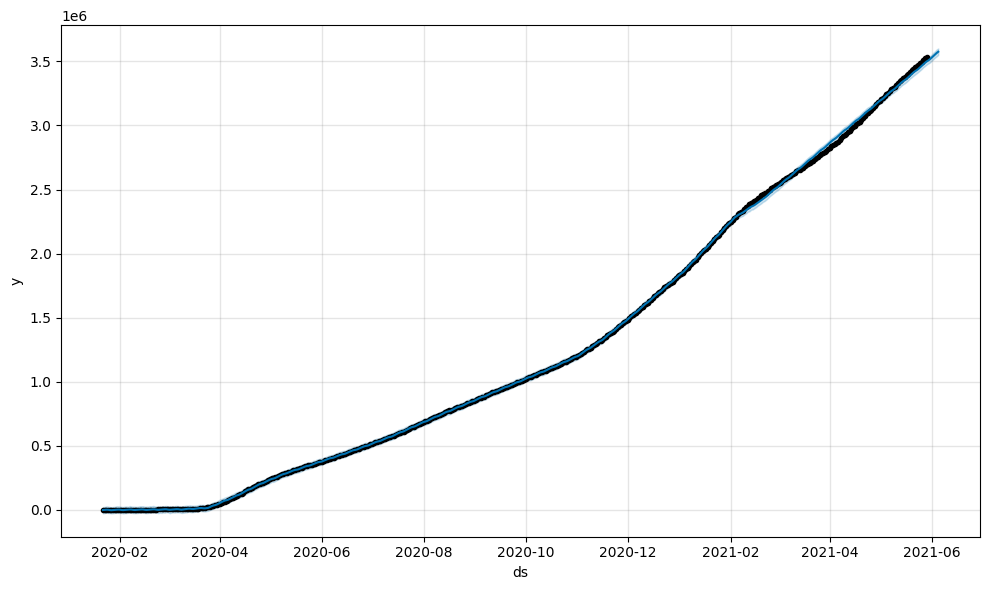

In [48]:
deaths_forecast_plot = m.plot(forecast)

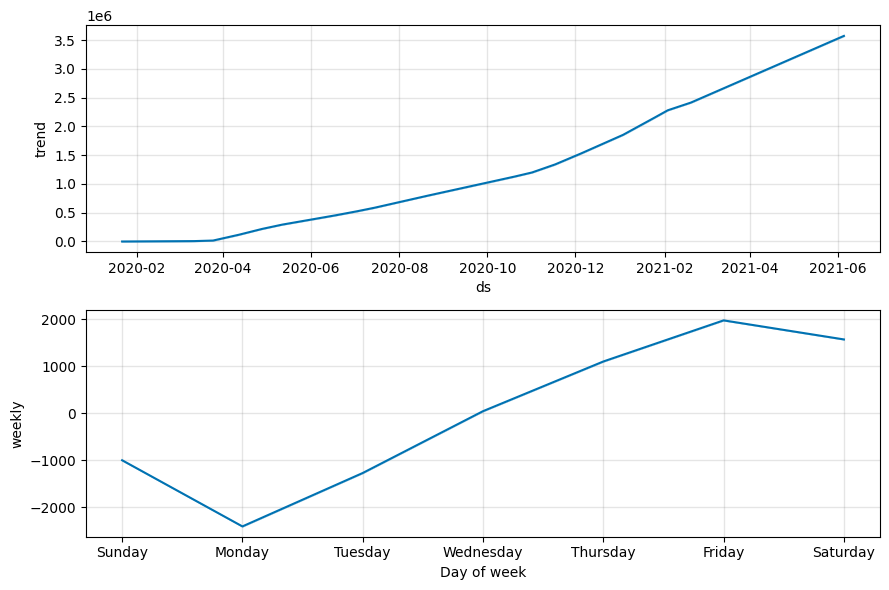

In [49]:
forecast_components = m.plot_components(forecast)

## Forecasting Recovered Cases Worldwide with Prophet (Baseline)

We perform a week's ahead forecast with Prophet, with 95% prediction intervals. Here, no tweaking of seasonality-related parameters and additional regressors are performed.

In [50]:
recovered.columns = ['ds','y']
recovered['ds'] = pd.to_datetime(recovered['ds'])

In [51]:
m = Prophet(interval_width=0.95)
m.fit(recovered)
future = m.make_future_dataframe(periods=7)
future_recovered = future.copy() # for non-baseline predictions later on
future.tail()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


,ds
496,2021-06-01
497,2021-06-02
498,2021-06-03
499,2021-06-04
500,2021-06-05


In [52]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
496,2021-06-01,1.030176e+08,1.002839e+08,1.057925e+08
497,2021-06-02,1.034821e+08,1.007023e+08,1.063239e+08
498,2021-06-03,1.039342e+08,1.013943e+08,1.068798e+08
499,2021-06-04,1.043768e+08,1.016075e+08,1.070651e+08
500,2021-06-05,1.048503e+08,1.019800e+08,1.076186e+08


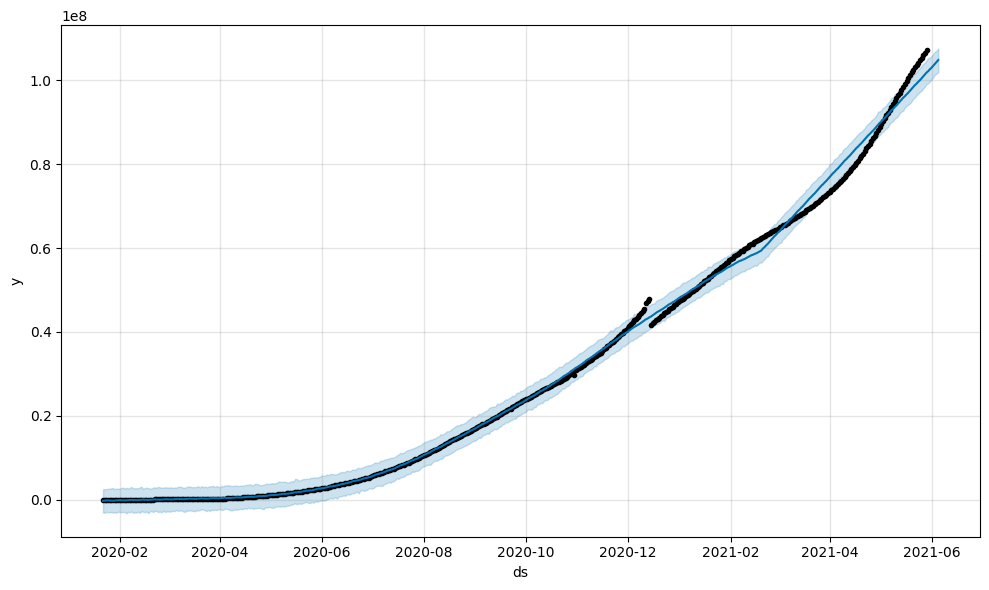

In [53]:
recovered_forecast_plot = m.plot(forecast)

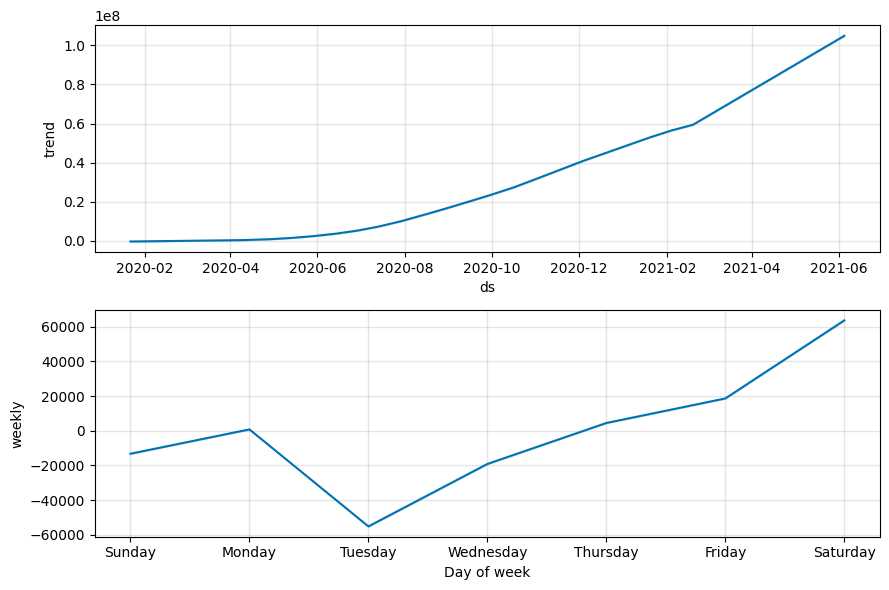

In [54]:
forecast_components = m.plot_components(forecast)

# Forecasting Confirmed, Death & Recovered Cases Worldwide with Prophet (by Country/Region & Province/State)

### Data Preparation

As we are now forecasting at country and state/province level, for small values, it is possible for forecasts to become negative. To counter this, we round negative values to zero. To perform forecast evaluations using mean absolute error (MAE), we require to partition the dataset into train & validation sets. Here, the test set will contain the dates for which the Prophet model is trained on and where forecasts were made.

In [55]:
days_to_forecast = 7 # changable
first_forecasted_date = sorted(list(set(df2['Date'].values)))[-days_to_forecast]

print('The first date to perform forecasts for is: ' + str(first_forecasted_date))

The first date to perform forecasts for is: 12/25/2020


In [56]:
confirmed_df = df2[['Date','Province/State', 'Country', 'Confirmed']]
confirmed_df

,Date,Province/State,Country,Confirmed
0,01/01/2021,Australian Capital Territory,Australia,118.0
1,01/01/2021,New South Wales,Australia,4947.0
2,01/01/2021,Northern Territory,Australia,75.0
3,01/01/2021,Queensland,Australia,1255.0
4,01/01/2021,South Australia,Australia,580.0
...,...,...,...,...
228316,12/31/2020,Vinnytsia Oblast,Ukraine,22500.0
228317,12/31/2020,Volyn Oblast,Ukraine,33016.0
228318,12/31/2020,Zakarpattia Oblast,Ukraine,28200.0
228319,12/31/2020,Zaporizhia Oblast,Ukraine,54088.0


In [57]:
deaths_df = df2[[ 'Date','Province/State', 'Country', 'Deaths']]
deaths_df

,Date,Province/State,Country,Deaths
0,01/01/2021,Australian Capital Territory,Australia,3.0
1,01/01/2021,New South Wales,Australia,54.0
2,01/01/2021,Northern Territory,Australia,0.0
3,01/01/2021,Queensland,Australia,6.0
4,01/01/2021,South Australia,Australia,4.0
...,...,...,...,...
228316,12/31/2020,Vinnytsia Oblast,Ukraine,395.0
228317,12/31/2020,Volyn Oblast,Ukraine,515.0
228318,12/31/2020,Zakarpattia Oblast,Ukraine,637.0
228319,12/31/2020,Zaporizhia Oblast,Ukraine,594.0


In [58]:
recovered_df = df2[[ 'Date','Province/State', 'Country', 'Recovered']]
recovered_df

,Date,Province/State,Country,Recovered
0,01/01/2021,Australian Capital Territory,Australia,114.0
1,01/01/2021,New South Wales,Australia,0.0
2,01/01/2021,Northern Territory,Australia,71.0
3,01/01/2021,Queensland,Australia,1224.0
4,01/01/2021,South Australia,Australia,566.0
...,...,...,...,...
228316,12/31/2020,Vinnytsia Oblast,Ukraine,15237.0
228317,12/31/2020,Volyn Oblast,Ukraine,28605.0
228318,12/31/2020,Zakarpattia Oblast,Ukraine,23526.0
228319,12/31/2020,Zaporizhia Oblast,Ukraine,20530.0


### Forecasting Confirmed Cases, Deaths & Recovered Cases and Computing Mean Absolute Error (MAE)

Next, we perform predictions for each country and state. Note that we compute MAE with the raw predictions before rounding.

In [59]:
def make_forecasts(all_countries, confirmed_df, deaths_df, recovered_df, days_to_forecast, first_forecasted_date, mode):
    forecast_dfs = []
    absolute_errors = [] # collate absolute errors so that we can find MAE later on
    counter = 0 # arbitrary counter to output snippet of result_val_df only once, when it is 1
    for country in all_countries:
        try:
            assert(country in confirmed_df['Country'].values)
            print('Country ' + str(country) + ' is listed! ')
            country_confirmed_df = confirmed_df[(confirmed_df['Country'] == country)]
            country_deaths_df = deaths_df[(deaths_df['Country'] == country)]
            country_recovered_df = recovered_df[(recovered_df['Country'] == country)]
            country_dfs = [('Confirmed', country_confirmed_df), 
                           ('Deaths', country_deaths_df), 
                           ('Recovered', country_recovered_df)]
            states_in_country = country_confirmed_df['Province/State'].unique()
            for state in states_in_country:
                try:
                    state_dfs = [] # to store forecasts for Confirmed, Deaths and Recovered

                    assert(state in country_confirmed_df['Province/State'].values)

                    # make forecasts for each case type (Confirmed, Deaths, Recovered)
                    for country_df_tup in country_dfs:
                        case_type = country_df_tup[0]
                        country_df = country_df_tup[1]
                        state_df = country_df[(country_df['Province/State'] == state)]

                        # data preparation for forecast with Prophet at state level
                        state_df = state_df[['Date', case_type]]
                        state_df.columns = ['ds','y']
                        state_df['ds'] = pd.to_datetime(state_df['ds'])

                        state_df_val = state_df[(state_df['ds'] >= pd.to_datetime(first_forecasted_date))] # validation set
                        state_df = state_df[(state_df['ds'] < pd.to_datetime(first_forecasted_date))] # train set

                        if mode == 'default':
                            m = Prophet()
                        elif mode == 'custom':
                            m = Prophet(daily_seasonality=False, weekly_seasonality=False, yearly_seasonality=False)
                            m.add_seasonality(name='monthly', period=30.5, fourier_order=10)
                            m.add_seasonality(name='weekly', period=7, fourier_order=21)
                            m.add_seasonality(name='daily', period=1, fourier_order=3)
                        m.fit(state_df)
                        future = m.make_future_dataframe(periods=days_to_forecast)
                        forecast = m.predict(future)

                        # evaluate forecasts with validation set and save absolute errors to absolute_errors
                        forecast_df = forecast[['ds', 'yhat']]
                        result_df = forecast_df[(forecast_df['ds'] >= pd.to_datetime(first_forecasted_date))]
                        result_val_df = result_df.merge(state_df_val, on=['ds'])
                        result_val_df['abs_diff'] = (result_val_df['y'] - result_val_df['yhat']).abs()
                        absolute_errors += list(result_val_df['abs_diff'].values)

                        # the following allows the user to check the output at particular checkpoints. Feel free to change!
                        if counter == 1:
                            print('Printing snippet of result_val_df: \n')
                            print(result_val_df)
                            print(absolute_errors)
                        counter += 1

                        # save results to dataframe
                        forecast_df['Province/State'] = state
                        forecast_df['Country/Region'] = country
                        forecast_df.rename(columns={'yhat':case_type}, inplace=True)
                        state_dfs += [forecast_df.tail(days_to_forecast)]

                    merged_df = state_dfs[0].merge(state_dfs[1],on=['ds', 'Province/State', 'Country/Region']).merge(state_dfs[2],on=['ds', 'Province/State', 'Country/Region'])
                    forecast_dfs += [merged_df]
                except:
                    continue
        except:
            print('Country ' + str(country) + ' is not listed! ')
            continue
    results_tup = namedtuple('results_tup', ['forecast_dfs', 'absolute_errors'])
    return results_tup(forecast_dfs, absolute_errors)

In [61]:
forecast_results = make_forecasts(all_countries, confirmed_df, deaths_df, recovered_df, days_to_forecast, first_forecasted_date, 'default')

first_forecasted_date = df2['Date'].max()
print("Forecasting starts after:", first_forecasted_date)



INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


Country Australia is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Printing snippet of result_val_df: 

          ds      yhat    y  abs_diff
0 2020-12-25  2.992785  3.0  0.007215
1 2020-12-26  3.003751  3.0  0.003751
2 2020-12-27  2.991412  3.0  0.008588
3 2020-12-28  3.003466  3.0  0.003466
4 2020-12-29  2.991125  3.0  0.008875
5 2020-12-30  3.004150  3.0  0.004150
6 2020-12-31  2.992781  3.0  0.007219
[0.1928459599199357, 0.2189721314471882, 0.14442604170496054, 0.1919737731987965, 0.2635314901723689, 0.3918464488952367, 0.22902888096410834, 0.007215474770601027, 0.003750929991631846, 0.008588060938188757, 0.0034661764576302545, 0.008874707763469214, 0.00415039433621045, 0.0072191674368631276]


INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

Country Belgium is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Brazil is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Canada is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Chile is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Colombia is listed! 


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithC

Country Denmark is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country France is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Germany is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Hong Kong is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country India is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Italy is listed! 


INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

Country Japan is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Macau is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Mainland China is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Mexico is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Netherlands is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Pakistan is listed! 


INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

Country Peru is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Russia is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Spain is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Sweden is listed! 


INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

Country UK is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country US is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Ukraine is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Forecasting starts after: 12/31/2020


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

### 🧩 Explicación del siguiente bloque de código

En esta celda se realiza una parte importante del proceso analítico.  
A continuación, se explicará cada bloque del código paso a paso:



In [62]:
forecast_results.forecast_dfs[0].tail(days_to_forecast) # example of a forecast

,ds,Confirmed,Province/State,Country/Region,Deaths,Recovered
0,2020-12-25,117.807154,Australian Capital Territory,Australia,2.992785,113.716611
1,2020-12-26,117.781028,Australian Capital Territory,Australia,3.003751,113.721972
2,2020-12-27,117.855574,Australian Capital Territory,Australia,2.991412,113.593817
3,2020-12-28,117.808026,Australian Capital Territory,Australia,3.003466,113.465672
4,2020-12-29,117.736469,Australian Capital Territory,Australia,2.991125,113.435137
5,2020-12-30,117.608154,Australian Capital Territory,Australia,3.004150,113.215686
6,2020-12-31,117.770971,Australian Capital Territory,Australia,2.992781,113.386558


### Some Final Touch-ups..

### 🧩 Explicación del siguiente bloque de código

En esta celda se realiza una parte importante del proceso analítico.  
A continuación, se explicará cada bloque del código paso a paso:



In [63]:
forecasts_final = pd.concat(forecast_results.forecast_dfs, axis=0)
forecasts_final.sort_values(by='ds')
forecasts_final = forecasts_final[['ds', 'Province/State', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
forecasts_final.rename(columns={'ds':'ObservationDate'}, inplace=True)
for case_type in ['Confirmed', 'Deaths', 'Recovered']:
    forecasts_final[case_type] = forecasts_final[case_type].round() # round forecasts to integer as humans cannot be floats
    forecasts_final[forecasts_final[case_type] < 0] = 0 # replace negative forecasts to zero

forecasts_final

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/262134369.py:7: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.



,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,2020-12-25 00:00:00,Australian Capital Territory,Australia,118.0,3.0,114.0
1,2020-12-26 00:00:00,Australian Capital Territory,Australia,118.0,3.0,114.0
2,2020-12-27 00:00:00,Australian Capital Territory,Australia,118.0,3.0,114.0
3,2020-12-28 00:00:00,Australian Capital Territory,Australia,118.0,3.0,113.0
4,2020-12-29 00:00:00,Australian Capital Territory,Australia,118.0,3.0,113.0
...,...,...,...,...,...,...
2,2020-12-27 00:00:00,Zhytomyr Oblast,Ukraine,39865.0,669.0,31451.0
3,2020-12-28 00:00:00,Zhytomyr Oblast,Ukraine,40274.0,676.0,31797.0
4,2020-12-29 00:00:00,Zhytomyr Oblast,Ukraine,40627.0,683.0,32312.0
5,2020-12-30 00:00:00,Zhytomyr Oblast,Ukraine,40975.0,691.0,32838.0


In [64]:
forecasts_final.to_csv("forecasts_default_prophet.csv", index=False) # save forecasts to CSV

## Prophet with Daily & Weekly Seasonality (with custom Fourier orders)

Prophet will by default fit weekly and yearly seasonalities, if the time series is more than two cycles long. It will also fit daily seasonality for a sub-daily time series. You can add other seasonalities (monthly, quarterly, hourly) using the add_seasonality method (Python) or function (R).

The inputs to this function are a name, the period of the seasonality in days, and the Fourier order for the seasonality. For reference, by default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality. An optional input to add_seasonality is the prior scale for that seasonal component - this is discussed below.

**Source:** https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#fourier-order-for-seasonalities

In [65]:
forecast_results_custom = make_forecasts(all_countries, confirmed_df, deaths_df, recovered_df, days_to_forecast, first_forecasted_date, 'custom')
absolute_errors_custom = forecast_results_custom.absolute_errors
forecast_dfs_custom = forecast_results_custom.forecast_dfs

INFO:cmdstanpy:start chain 1


Country Australia is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Printing snippet of result_val_df: 

          ds      yhat    y  abs_diff
0 2020-12-31  2.984611  3.0  0.015389
1 2021-01-01  2.949440  3.0  0.050560
2 2021-01-02  2.962988  3.0  0.037012
3 2021-01-03  3.000168  3.0  0.000168
4 2021-01-04  3.055501  3.0  0.055501
5 2021-01-05  3.043228  3.0  0.043228
6 2021-01-06  3.031328  3.0  0.031328
[0.5920093404058235, 0.9861953838185684, 1.0054278405576866, 1.0885453565714585, 1.0179482241781699, 0.8857367735979267, 0.6759443778835674, 0.015389372481570351, 0.050560218047865924, 0.03701245938331521, 0.00016778127830008316, 0.05550112164122778, 0.043227699519724716, 0.03132820346612908]


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Belgium is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Brazil is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Canada is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Chile is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Colombia is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Denmark is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country France is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Germany is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Hong Kong is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country India is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Italy is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Japan is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Macau is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Mainland China is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Mexico is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Netherlands is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Pakistan is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Peru is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Russia is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Spain is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country Sweden is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country UK is listed! 


/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Country US is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

Country Ukraine is listed! 


INFO:cmdstanpy:finish chain 1
/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:62: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:63: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3744576759.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

In [69]:
print(type(forecast_results))
print(forecast_results)


<class '__main__.results_tup'>
results_tup(forecast_dfs=[          ds   Confirmed                Province/State Country/Region  \
0 2020-12-25  117.807154  Australian Capital Territory      Australia   
1 2020-12-26  117.781028  Australian Capital Territory      Australia   
2 2020-12-27  117.855574  Australian Capital Territory      Australia   
3 2020-12-28  117.808026  Australian Capital Territory      Australia   
4 2020-12-29  117.736469  Australian Capital Territory      Australia   
5 2020-12-30  117.608154  Australian Capital Territory      Australia   
6 2020-12-31  117.770971  Australian Capital Territory      Australia   

     Deaths   Recovered  
0  2.992785  113.716611  
1  3.003751  113.721972  
2  2.991412  113.593817  
3  3.003466  113.465672  
4  2.991125  113.435137  
5  3.004150  113.215686  
6  2.992781  113.386558  ,           ds    Confirmed   Province/State Country/Region     Deaths  \
0 2020-12-25  4749.525413  New South Wales      Australia  53.098995   
1 202

In [71]:
print(type(forecast_results))
print(len(forecast_results))
print(forecast_results)


<class '__main__.results_tup'>
2
results_tup(forecast_dfs=[          ds   Confirmed                Province/State Country/Region  \
0 2020-12-25  117.807154  Australian Capital Territory      Australia   
1 2020-12-26  117.781028  Australian Capital Territory      Australia   
2 2020-12-27  117.855574  Australian Capital Territory      Australia   
3 2020-12-28  117.808026  Australian Capital Territory      Australia   
4 2020-12-29  117.736469  Australian Capital Territory      Australia   
5 2020-12-30  117.608154  Australian Capital Territory      Australia   
6 2020-12-31  117.770971  Australian Capital Territory      Australia   

     Deaths   Recovered  
0  2.992785  113.716611  
1  3.003751  113.721972  
2  2.991412  113.593817  
3  3.003466  113.465672  
4  2.991125  113.435137  
5  3.004150  113.215686  
6  2.992781  113.386558  ,           ds    Confirmed   Province/State Country/Region     Deaths  \
0 2020-12-25  4749.525413  New South Wales      Australia  53.098995   
1 2

In [66]:
forecasts_final_custom = pd.concat(forecast_dfs_custom, axis=0)
forecasts_final_custom.sort_values(by='ds')
forecasts_final_custom = forecasts_final_custom[['ds', 'Province/State', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
forecasts_final_custom.rename(columns={'ds':'ObservationDate'}, inplace=True)
for case_type in ['Confirmed', 'Deaths', 'Recovered']:
    forecasts_final_custom[case_type] = forecasts_final_custom[case_type].round() # round forecasts to integer as humans cannot be floats
    forecasts_final_custom[forecasts_final_custom[case_type] < 0] = 0 # replace negative forecasts to zero

forecasts_final_custom

/var/folders/tz/xnwn5s896fqbdylrqsccljvh0000gn/T/ipykernel_15500/3513736928.py:7: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.



,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,2020-12-31 00:00:00,Australian Capital Territory,Australia,119.0,3.0,112.0
1,2021-01-01 00:00:00,Australian Capital Territory,Australia,119.0,3.0,112.0
2,2021-01-02 00:00:00,Australian Capital Territory,Australia,119.0,3.0,112.0
3,2021-01-03 00:00:00,Australian Capital Territory,Australia,119.0,3.0,112.0
4,2021-01-04 00:00:00,Australian Capital Territory,Australia,119.0,3.0,112.0
...,...,...,...,...,...,...
2,2021-01-02 00:00:00,Zhytomyr Oblast,Ukraine,41184.0,689.0,33993.0
3,2021-01-03 00:00:00,Zhytomyr Oblast,Ukraine,41590.0,694.0,34381.0
4,2021-01-04 00:00:00,Zhytomyr Oblast,Ukraine,41954.0,700.0,34776.0
5,2021-01-05 00:00:00,Zhytomyr Oblast,Ukraine,42208.0,706.0,35306.0


In [67]:
forecasts_final_custom.to_csv("forecasts_custom_prophet.csv", index=False) # save forecasts to CSV

# Evaluation of Forecasts (Mean Absolute Error)

In [72]:
absolute_errors = forecast_results.absolute_errors

N = len(absolute_errors)
mean_absolute_error = sum(absolute_errors) / N

print(f"The mean absolute error for {days_to_forecast} days of forecasts is: {round(mean_absolute_error, 2)}")


The mean absolute error for 7 days of forecasts is: 4210.14


In [73]:
N = len(absolute_errors)
mean_absolute_error = sum(absolute_errors)/N
print('The mean absolute error for ' + str(days_to_forecast) + ' days of forecasts with the default Prophet model is: ' + str(round(mean_absolute_error, 2))) # round to 2 decimal places

The mean absolute error for 7 days of forecasts with the default Prophet model is: 4210.14


In [74]:
mean_absolute_error_custom = sum(absolute_errors_custom)/N
print('The mean absolute error for ' + str(days_to_forecast) + ' days of forecasts with the custom Prophet model is: ' + str(round(mean_absolute_error_custom, 2))) # round to 2 decimal places

The mean absolute error for 7 days of forecasts with the custom Prophet model is: 4093.33
